In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import tensorflow as tf
print(tf.__version__)

def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\n","mae:", mae, "\n","mse:",mse, "\n","rmse:",rmse)

2.4.0


In [6]:
df = pd.read_csv('kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [7]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [9]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


/Users/me/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

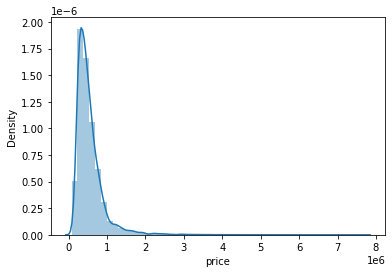

In [10]:
sns.distplot(df['price'])

/Users/me/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bedrooms', ylabel='count'>

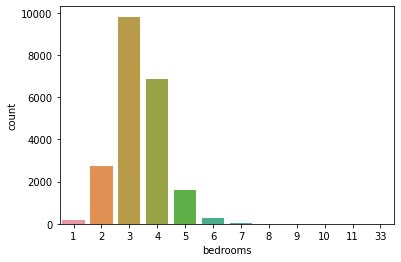

In [11]:
sns.countplot(df['bedrooms'])

In [12]:
df['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

In [13]:
df[df['bedrooms']==33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15856,2402100895,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,...,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [14]:
df.corr()['price'].sort_values()

zipcode         -0.053
id              -0.017
long             0.022
condition        0.036
yr_built         0.054
sqft_lot15       0.083
sqft_lot         0.090
yr_renovated     0.126
floors           0.257
waterfront       0.266
lat              0.307
bedrooms         0.309
sqft_basement    0.324
view             0.397
bathrooms        0.526
sqft_living15    0.585
sqft_above       0.605
grade            0.668
sqft_living      0.702
price            1.000
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

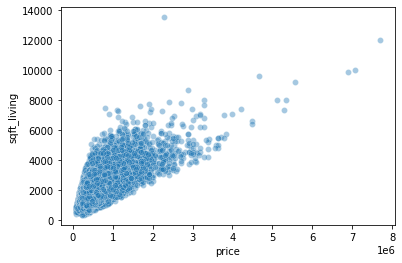

In [15]:
sns.scatterplot(x='price',y='sqft_living',data=df,alpha=0.4,estimator='std',ci=90)

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

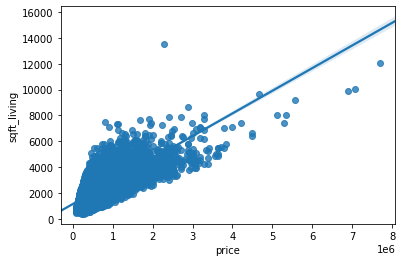

In [16]:
sns.regplot(x='price',y='sqft_living',data=df,truncate=False)

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

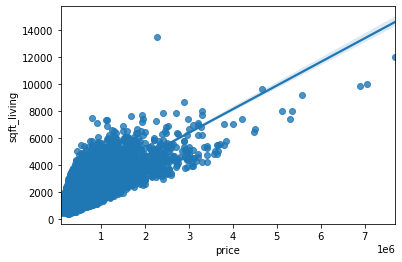

In [17]:
sns.regplot(x='price',y='sqft_living',data=df,truncate=True)

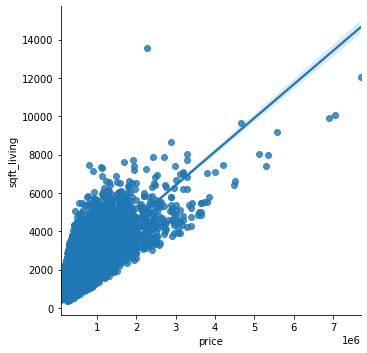

In [18]:
sns.lmplot(x='price',y='sqft_living',data=df)

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

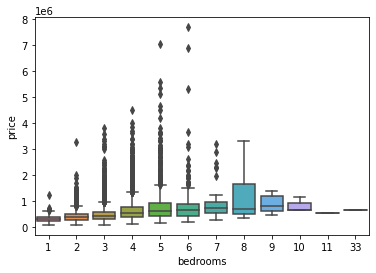

In [19]:
sns.boxplot(x='bedrooms',y='price',data=df)

<AxesSubplot:xlabel='price', ylabel='long'>

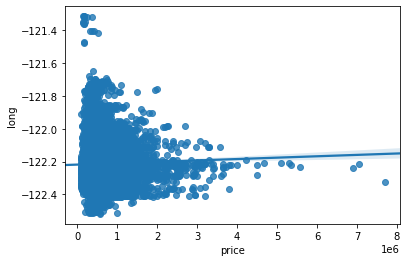

In [20]:
sns.regplot(x='price',y='long',data=df,truncate=False)

<AxesSubplot:xlabel='price', ylabel='lat'>

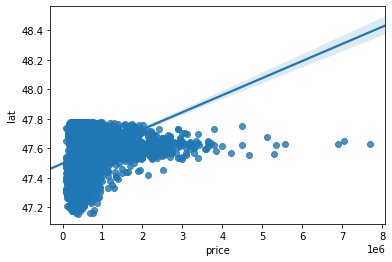

In [21]:
sns.regplot(x='price',y='lat',data=df,truncate=False)

<AxesSubplot:xlabel='long', ylabel='lat'>

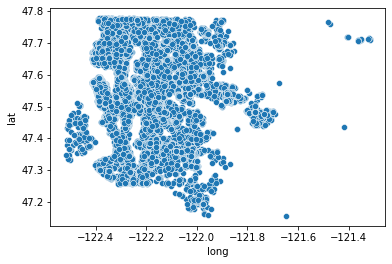

In [22]:
sns.scatterplot(x='long',y='lat',data=df)

In [23]:
import folium
folium.Map(location=[df["lat"].mean(),df["long"].mean()], zoom_start=8)

In [26]:
map_kc = folium.Map(location=[47.511,  -122.257], zoom_start=10)
for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        color='blue',
        fill=False,
        fill_color='#3186CC',
        fill_opacity=0.3).add_to(map_kc)
map_kc

In [27]:
df.sort_values('price',ascending=False).head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,...,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,9808700762,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,...,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9208900037,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,...,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,2470100110,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,...,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,8907500070,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,...,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,7558700030,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,...,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,1247600105,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,...,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,1924059029,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,...,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,7738500731,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,...,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,3835500195,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,...,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [28]:
len(df) * 0.01

215.97

In [29]:
df.sort_values('price',ascending=False).iloc[216:]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
6329,824059321,6/2/2014,1970000.000,4,3.500,4370,8510,2.000,0,1,...,10,3610,760,2003,0,98004,47.588,-122.204,2960,10347
12271,1923000260,10/15/2014,1960000.000,5,4.500,6200,23373,3.000,0,1,...,11,5050,1150,1988,0,98040,47.563,-122.215,3700,14486
9166,3124059023,2/13/2015,1960000.000,3,1.750,3330,12566,1.000,1,4,...,8,1940,1390,1960,0,98040,47.529,-122.220,3730,16560
12565,2806300065,4/22/2015,1960000.000,4,4.000,4430,31353,2.000,0,0,...,12,4430,0,1998,0,98005,47.642,-122.157,3900,35237
1150,4055701200,4/21/2015,1960000.000,4,2.750,3120,7898,1.000,1,4,...,8,1560,1560,1963,0,98034,47.717,-122.259,2630,13868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,1623049041,5/8/2014,82500.000,2,1.000,520,22334,1.000,0,0,...,5,520,0,1951,0,98168,47.480,-122.296,1572,10570
8267,3883800011,11/5/2014,82000.000,3,1.000,860,10426,1.000,0,0,...,6,860,0,1954,0,98146,47.499,-122.341,1140,11250
16184,3028200080,3/24/2015,81000.000,2,1.000,730,9975,1.000,0,0,...,5,730,0,1943,0,98168,47.481,-122.315,860,9000
465,8658300340,5/23/2014,80000.000,1,0.750,430,5050,1.000,0,0,...,4,430,0,1912,0,98014,47.650,-121.909,1200,7500


<AxesSubplot:xlabel='long', ylabel='lat'>

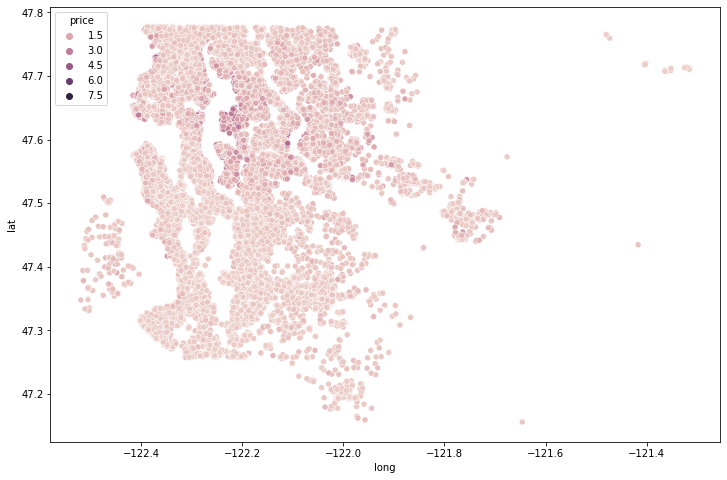

In [30]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price')

<AxesSubplot:xlabel='long', ylabel='lat'>

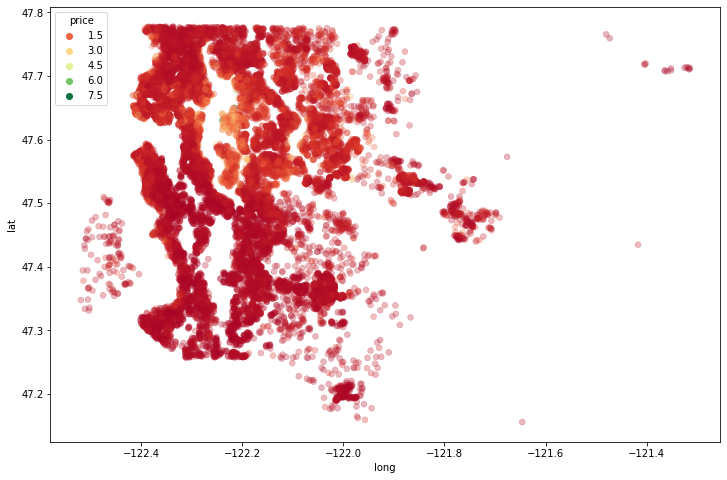

In [31]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat',data=df,hue='price',palette="RdYlGn",alpha=0.3, edgecolor=None)

In [32]:
!which python3

/Users/me/opt/anaconda3/bin/python3


<AxesSubplot:xlabel='waterfront', ylabel='price'>

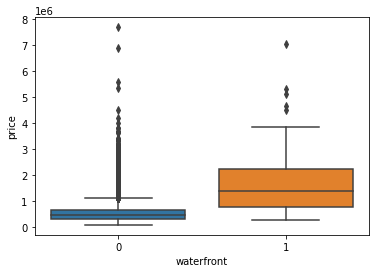

In [33]:
sns.boxplot(x='waterfront',y='price',data=df)

In [34]:
df.drop('id',axis=1,inplace=True)

In [35]:
df['date']= pd.to_datetime(df['date'])

In [36]:
df['month'] = df['date'].apply(lambda x : x.month)
df['year'] = df['date'].apply(lambda x : x.year)

df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month,year
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,...,0,1955,0,98178,47.511,-122.257,1340,5650,10,2014
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,...,400,1951,1991,98125,47.721,-122.319,1690,7639,12,2014
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,...,0,1933,0,98028,47.738,-122.233,2720,8062,2,2015
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,...,910,1965,0,98136,47.521,-122.393,1360,5000,12,2014
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,...,0,1987,0,98074,47.617,-122.045,1800,7503,2,2015


<AxesSubplot:xlabel='year', ylabel='price'>

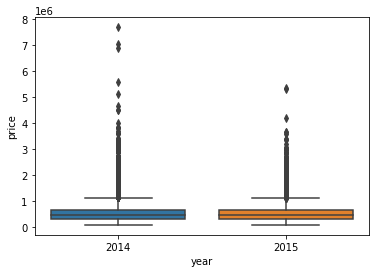

In [37]:
sns.boxplot(x='year',y='price',data=df)

(0.0, 2000000.0)

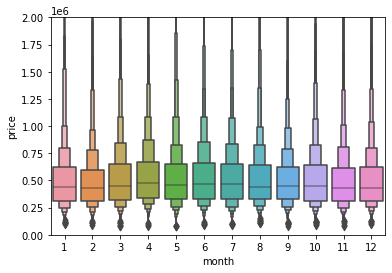

In [38]:
sns.boxenplot(x='month',y='price',data=df)
plt.ylim(0,2000000)

<AxesSubplot:xlabel='month'>

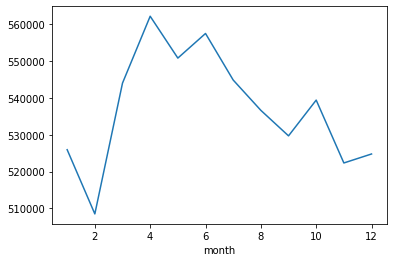

In [39]:
df.groupby('month').mean()['price'].plot()

<AxesSubplot:xlabel='year,month'>

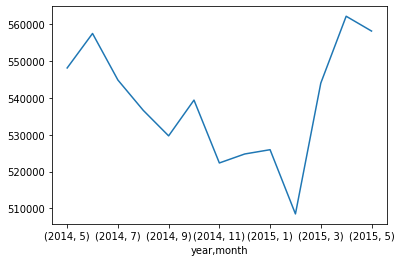

In [40]:
df.groupby(['year','month']).mean()['price'].plot()

In [41]:
df.drop('date',axis=1,inplace=True)

In [42]:
df.drop('zipcode',axis=1,inplace=True)

In [43]:
#yr_renovated if its 0 when we scale it will be still 0 others will come down.
df['yr_renovated'].value_counts()

0       20683
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [44]:
#sqft_basement if its 0 when we scale it will be still 0 others will come down.
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
792         1
2590        1
935         1
2390        1
248         1
Name: sqft_basement, Length: 306, dtype: int64

# Scale and Train Test Split